In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mode
from pydub import AudioSegment
import IPython.display as ipd
import math

## Load audio

In [4]:
# Load the audio file
audio_file = r"..\data\audio_files\processed_download\CloZee - Microworlds.mp3"
#audio_file = r"..\data\audio_files\processed\2.mp3"
sr=22050
y, sr = librosa.load(audio_file, sr=sr)
hop_length = 512

duration = librosa.get_duration(y=y, sr=sr)
y_harm, y_perc = librosa.effects.hpss(y)
onset_env = librosa.onset.onset_strength(y=y, sr=sr)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr)

### Function to quantize beats/measures

In [5]:
def quantize_beats(beats, onset_env, tempo, sr, hop_length, duration):
    """
    Adjusts beat times to the nearest detected onsets and creates beat and measure grids for the audio.

    This function assumes the beat times are evenly spaced within each measure and are in 4/4 time signature. It also backtracks the beats using the onset envelope to align them to the nearest detected onset.

    Parameters:
    beats : np.ndarray
        An array of beat times in frame units generated from librosa.beat.beat_track.
    onset_env : np.ndarray
        Onset envelope of the audio signal, used for backtracking beats.
    tempo : float
        Estimated tempo of the audio in beats per minute.
    sr : int
        Sampling rate of the audio signal.
    hop_length : int
        Hop length used in the onset detection and beat tracking.
    duration : float
        Duration of the audio signal in seconds.

    Returns:
    beat_grid : np.ndarray
        Array of quantized beat times.
    measure_grid : np.ndarray
        Array of quantized measure start times.
    beats_per_measure : int
        Number of beats per measure, which is set to 4 for a 4/4 time signature.

    Raises:
    ValueError: If the `beats` array is empty or not one-dimensional.
    """
    # Validate input
    if beats.ndim != 1:
        raise ValueError("The 'beats' array must be one-dimensional.")
    if beats.size == 0:
        raise ValueError("The 'beats' array must not be empty.")
    
    # Hardcoded assumption of 4/4 time signature
    beats_per_measure = 4

    # Track beats to align them to the nearest detected onset
    beat_times = librosa.frames_to_time(beats, sr=sr, hop_length=hop_length)

    # Calculate the beat interval (seconds per beat)
    beat_interval = 60.0 / tempo

    # Backtrack from the first beat to align with time 0 if necessary
    first_beat_time = 0

    # Create beat grid from the first beat time to the end of the song
    beat_grid = np.arange(first_beat_time, duration, beat_interval)

    # Ensure beat grid does not go past the duration of the song
    beat_grid = beat_grid[beat_grid <= duration]

    # Create measure grid
    measure_indices = np.arange(0, len(beat_grid), beats_per_measure)
    measure_grid = beat_grid[measure_indices]

    # Ensure measure grid does not go past the duration of the song
    measure_grid = measure_grid[measure_grid <= duration]

    return beat_grid, measure_grid

In [6]:
beat_grid, measure_grid = quantize_beats(beats, onset_env, tempo, sr, hop_length, duration)
measure_numbers = np.arange(len(measure_grid))
measure_dict = {measure_number: measure_time for measure_number, measure_time in zip(measure_numbers, measure_grid)}

### Function to overlay measure/beat grid on x-axis

In [7]:
def apply_measure_grid(ax, measure_grid, measure_numbers):
    """
    This function takes an axis object and applies measure grid lines,
    sets x-ticks to measure start times for every fourth measure starting from measure 0,
    labels them with measure numbers, and applies sub-ticks for intermediate measure times.
    
    Parameters:
    ax (matplotlib.axes.Axes): The axis object to modify.
    measure_grid (list or array): The list or array of measure start times in seconds.
    measure_numbers (list or array): The list or array of measure numbers corresponding to the start times.
    """
    # Adjust the list to start from measure 0 and get every fourth measure
    major_measure_indices = [i for i, measure_num in enumerate(measure_numbers) if (measure_num) % 4 == 0]
    major_measures = [measure_grid[i] for i in major_measure_indices]
    major_labels = [measure_numbers[i] for i in major_measure_indices]
    
    # Set major x-axis ticks and labels (for measure 0 and every fourth measure after)
    ax.set_xticks(major_measures, minor=False)
    ax.set_xticklabels(major_labels, minor=False)

    # Set minor x-axis ticks (for intermediate measures)
    minor_measures = [measure for i, measure in enumerate(measure_grid) if i not in major_measure_indices]
    ax.set_xticks(minor_measures, minor=True)
    
    # Overlay the major measure grid lines on the plot (for measure 0 and every fourth measure after)
    for measure_time in major_measures:
        ax.axvline(x=measure_time, color='green', linestyle='--', linewidth=2)  # Adjusted linewidth for major ticks
    
    # Overlay the minor measure grid lines on the plot (for intermediate measures)
    for measure_time in minor_measures:
        ax.axvline(x=measure_time, color='grey', linestyle=':', linewidth=1, alpha=0.8)  # Adjusted linewidth for minor ticks
    
    ax.set_xlabel('Measure Number')

In [8]:
# Function to play audio from start_measure to end_measure using IPython.display.Audio
def play_audio_snippet(file_path, start_measure, end_measure, measure_dict, sr):
    # Load the full audio file
    full_audio = AudioSegment.from_file(file_path)
    
    # Convert measures to milliseconds for pydub
    start_time_ms = measure_dict[start_measure] * 1000
    end_time_ms = measure_dict[end_measure] * 1000
    
    # Extract the snippet using the times from measure_dict
    audio_snippet = full_audio[start_time_ms:end_time_ms]
    
    # Convert audio_snippet to raw audio data (samples) as a NumPy array
    samples = np.array(audio_snippet.get_array_of_samples())
    if audio_snippet.channels == 2:  # Check if audio is stereo and, if so, convert it to mono
        samples = samples.reshape((-1, 2)).mean(axis=1)
    
    # Play the audio snippet in Jupyter
    return ipd.Audio(samples, rate=sr, autoplay=True)

## Harmonic/Percussive Waveform

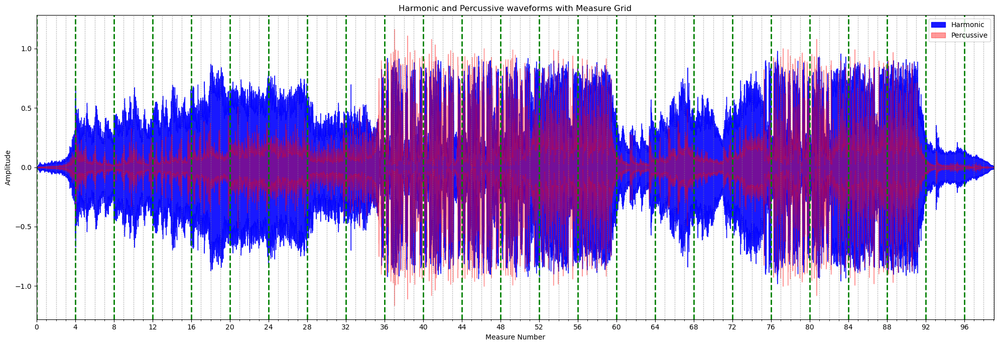

In [7]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.waveshow(y_harm, sr=sr, alpha=0.9, ax=ax, label='Harmonic', color='b')
librosa.display.waveshow(y_perc, sr=sr, alpha=0.4, ax=ax, label='Percussive', color='r')
ax.set_xlim([0, duration])
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_ylabel('Amplitude')
ax.set(title='Harmonic and Percussive waveforms with Measure Grid')
ax.legend()
plt.tight_layout()
plt.show()

## Tempogram

In [9]:
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)

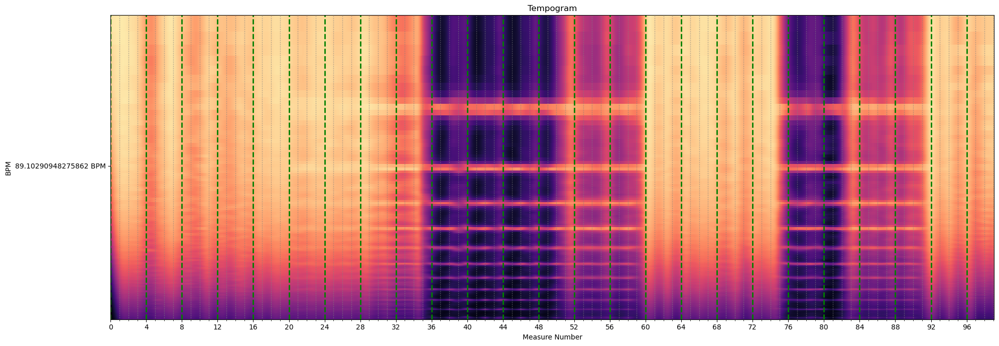

In [9]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(tempogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='tempo')
ax.set_yticks([tempo])
ax.set_yticklabels([str(tempo) + ' BPM'])
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_xlabel('Measure Number')
plt.title('Tempogram')
plt.tight_layout()
plt.show()

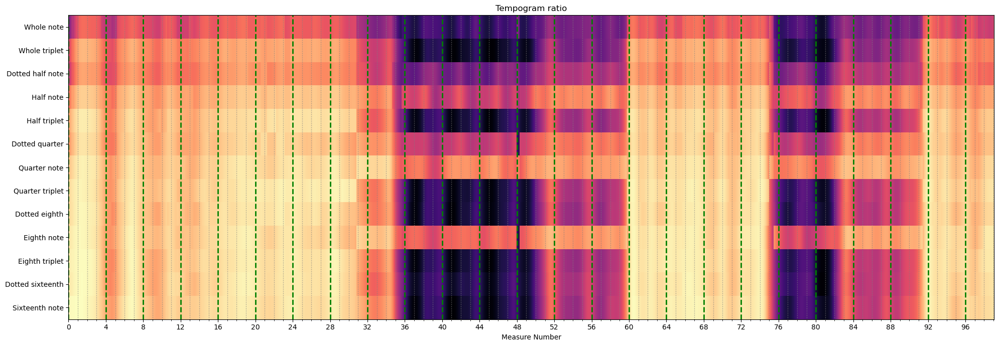

In [10]:
# Tempogram ratio
tgr = librosa.feature.tempogram_ratio(tg=tempogram, sr=sr)
# Define your note labels
note_labels = [
    'Sixteenth note',
    'Dotted sixteenth',
    'Eighth triplet',
    'Eighth note',
    'Dotted eighth',
    'Quarter triplet',
    'Quarter note',
    'Dotted quarter',
    'Half triplet',
    'Half note',
    'Dotted half note',
    'Whole triplet',
    'Whole note'
]
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(tgr, x_axis='time', ax=ax, sr=sr)
ax.set_xlim([0, duration])
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set(title="Tempogram ratio")
ax.set_yticks(range(len(note_labels)))
ax.set_yticklabels(note_labels)
plt.tight_layout()
plt.show()

## Chromagram

In [11]:
# Calculate the chromagram
chroma_cq = librosa.feature.chroma_cqt(y=y_harm, sr=sr)

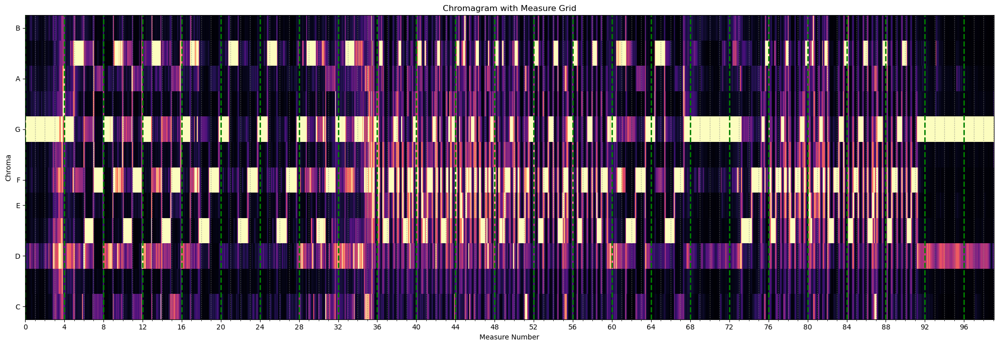

In [12]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(chroma_cq, sr=sr, hop_length=hop_length, y_axis='chroma', x_axis='time')
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_ylabel('Chroma')
ax.set_title('Chromagram with Measure Grid')

plt.tight_layout()
plt.show()

## Melspectrogram

In [12]:
# Compute Melspectrogram
D = np.abs(librosa.stft(y))**2
S = librosa.feature.melspectrogram(S=D, sr=sr)
S_dB = librosa.power_to_db(S, ref=np.max)

Text(0.5, 1.0, 'MelSpectrogram')

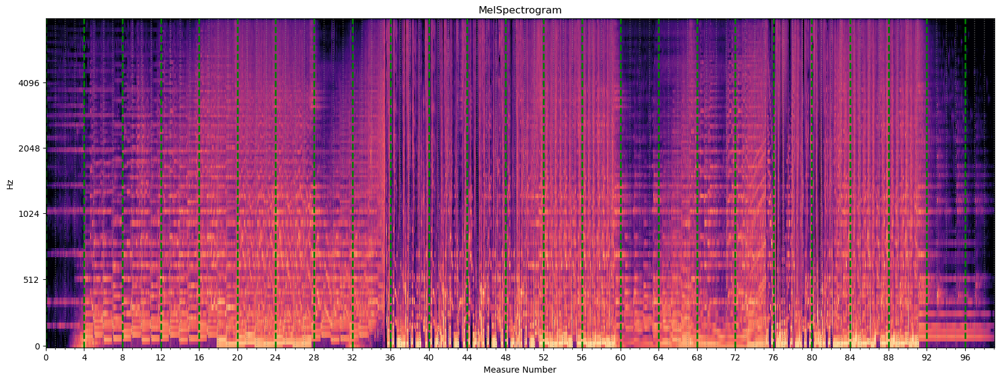

In [14]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_title('MelSpectrogram')

In [13]:
Spectrogram, phase = librosa.magphase(librosa.stft(y=y))
db_spectrogram = librosa.amplitude_to_db(Spectrogram, ref=np.max)

cent = librosa.feature.spectral_centroid(S=Spectrogram, sr=sr, hop_length=hop_length)
cent_times = librosa.times_like(cent)

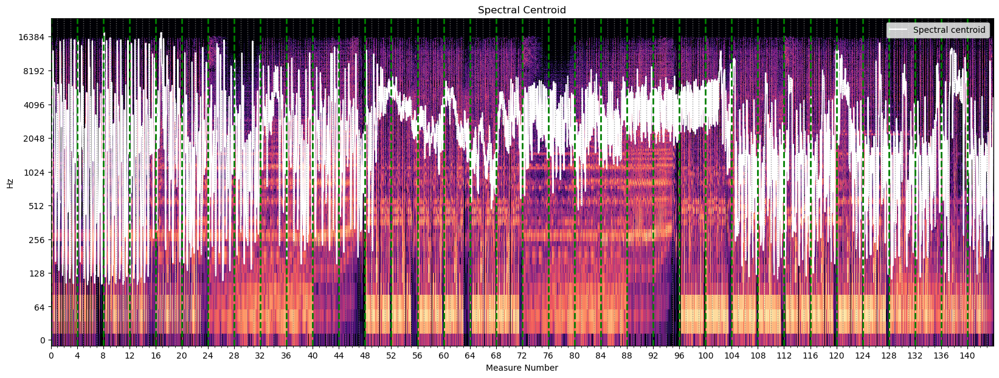

In [22]:
fig, ax = plt.subplots(figsize=(20, 7))

librosa.display.specshow(db_spectrogram, y_axis='log', x_axis='time', ax=ax, sr=sr, hop_length=hop_length)
ax.plot(cent_times, cent.T, label='Spectral centroid', color='w')
ax.set_xlim([0, duration])
ax.legend(loc='upper right')
ax.set(title='Spectral Centroid')
apply_measure_grid(ax, measure_grid, measure_numbers)

In [14]:
rolloff = librosa.feature.spectral_rolloff(S=Spectrogram, sr=sr, roll_percent=0.90)
rolloff_min = librosa.feature.spectral_rolloff(S=Spectrogram, sr=sr, roll_percent=0.01)

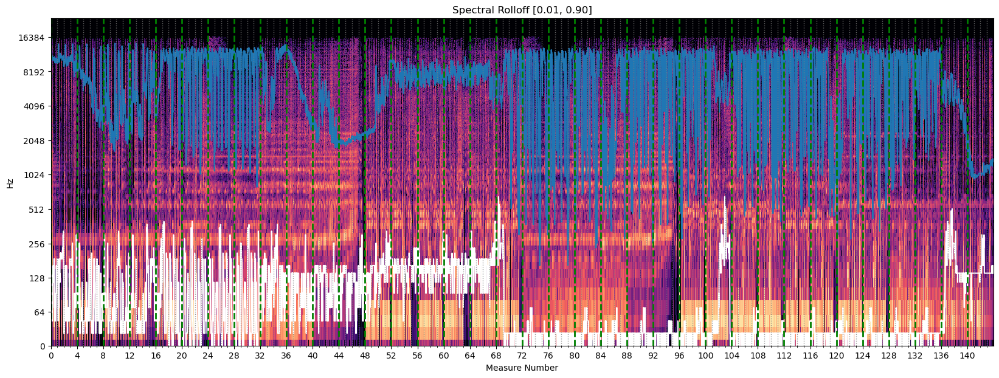

In [455]:
fig, ax = plt.subplots(figsize=(20, 7))
db_spectrogram = librosa.amplitude_to_db(Spectrogram, ref=np.max)

# Display the spectrogram
librosa.display.specshow(db_spectrogram, y_axis='log', x_axis='time', ax=ax, sr=sr)

# Set title and x-axis limit
ax.set(title='Spectral Rolloff [0.01, 0.90]')
ax.set_xlim([0, duration])

# Overlay the spectral rolloff frequencies
ax.plot(librosa.times_like(rolloff), rolloff[0], label='Roll-off frequency (0.90)')
ax.plot(librosa.times_like(rolloff), rolloff_min[0], color='w', label='Roll-off frequency (0.01)')

# Apply the custom measure grid function
apply_measure_grid(ax, measure_grid, measure_numbers)

# Set the y-axis limit to match the frequency range of the spectrogram
# Assuming the spectrogram is computed with the full frequency range of the signal
freqs = librosa.fft_frequencies(sr=sr, n_fft=Spectrogram.shape[0])
ax.set_ylim([freqs.min(), freqs.max()])

plt.show()

In [456]:
contrast = librosa.feature.spectral_contrast(S=Spectrogram, sr=sr)

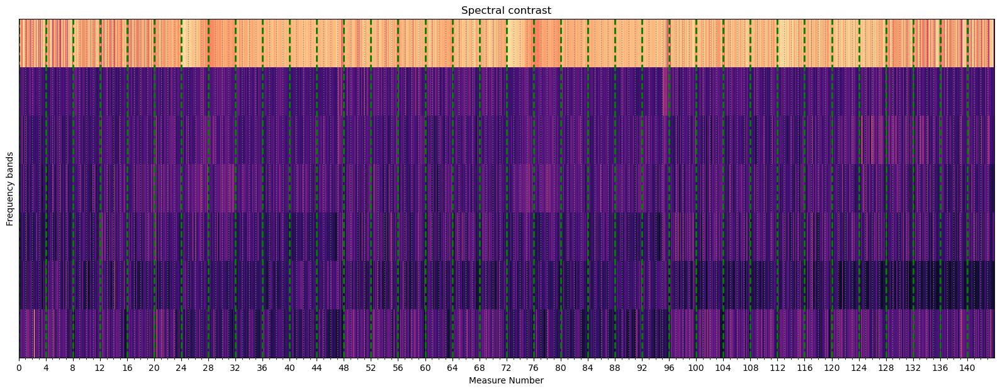

In [457]:
fig, ax = plt.subplots(figsize=(20, 7))
# Display the spectrogram
librosa.display.specshow(contrast, x_axis='time', ax=ax, sr=sr)
ax.set(ylabel='Frequency bands', title='Spectral contrast')
apply_measure_grid(ax, measure_grid, measure_numbers)

In [458]:
# MFCC
mfccs = librosa.feature.mfcc(S=S_dB)

Text(0.5, 1.0, 'MFCC')

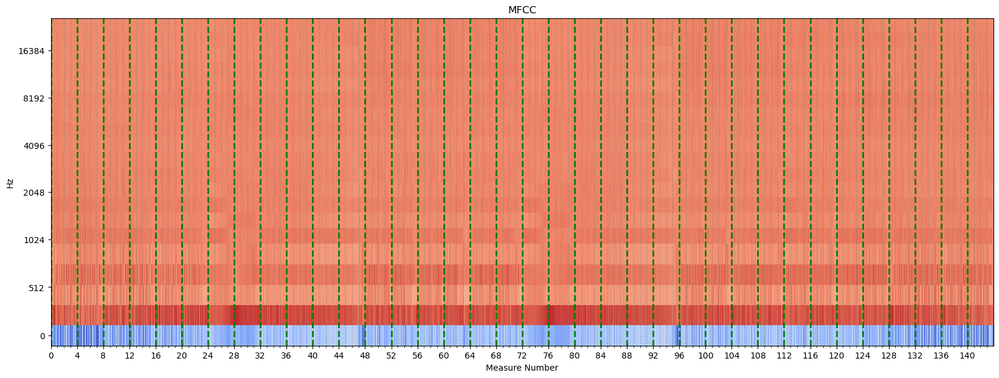

In [459]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(mfccs, x_axis='time',
                         y_axis='mel', sr=sr,
                         hop_length=hop_length)
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_title('MFCC')

In [460]:
# Compute the tonnetz features
tonnetz = librosa.feature.tonnetz(y=y, sr=sr, chroma=chroma_cq)

Text(0.5, 1.0, 'Tonnetz features')

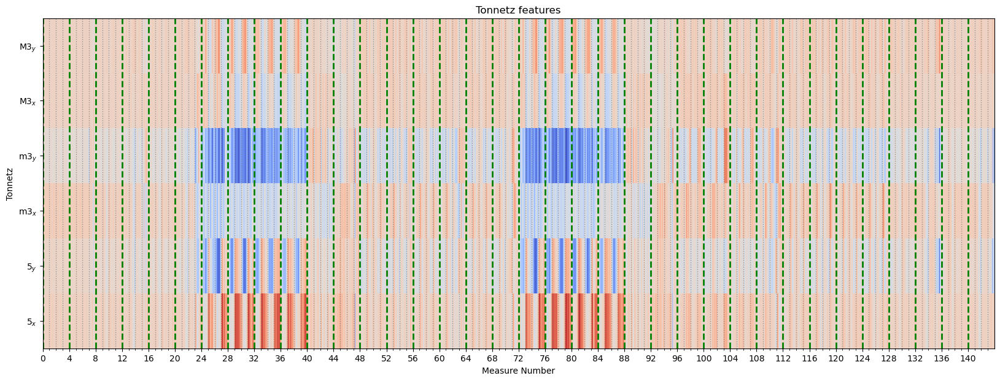

In [461]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.specshow(tonnetz, sr=sr, hop_length=hop_length,y_axis='tonnetz', x_axis='time')
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_title('Tonnetz features')

In [462]:
# Poly features
p0 = librosa.feature.poly_features(S=Spectrogram, order=0)
p1 = librosa.feature.poly_features(S=Spectrogram, order=1)
p2 = librosa.feature.poly_features(S=Spectrogram, order=2)

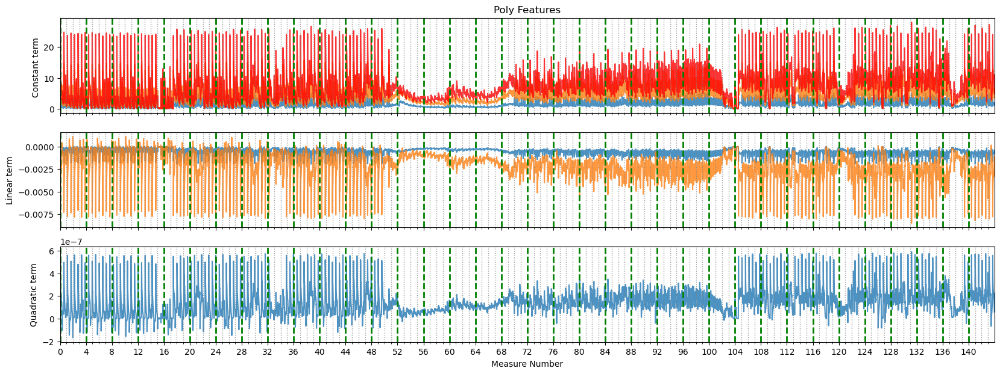

In [463]:
fig, ax = plt.subplots(nrows=3, sharex=True, figsize=(20, 7))
poly_times = librosa.times_like(p0)
ax[0].plot(poly_times, p0[0], label='order=0', alpha=0.8)
ax[0].plot(poly_times, p1[1], label='order=1', alpha=0.8)
ax[0].plot(poly_times, p2[2], label='order=2', alpha=0.8, color = 'red')
apply_measure_grid(ax[0], measure_grid, measure_numbers)
ax[0].set_xlim([0, duration])
ax[0].label_outer()
ax[0].set(ylabel='Constant term ', title='Poly Features')
ax[1].plot(poly_times, p1[0], label='order=1', alpha=0.8)
ax[1].plot(poly_times, p2[1], label='order=2', alpha=0.8)
ax[1].set(ylabel='Linear term')
apply_measure_grid(ax[1], measure_grid, measure_numbers)
ax[1].label_outer()
ax[2].plot(poly_times, p2[0], label='order=2', alpha=0.8)
ax[2].set(ylabel='Quadratic term')
apply_measure_grid(ax[2], measure_grid, measure_numbers)

## Experimenting with different ways to detect BPM/tempo

This method assumes that the most stable intervals in between beats represent a deliberate tempo chosen during the production of the music.

In [23]:
import librosa
import numpy as np
from typing import Tuple, List, Optional
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

In [ ]:
# Load the audio file
audio_file = r"..\data\audio_files\processed_download\CloZee - Microworlds.mp3"
sr=22050

y, sr = librosa.load(audio_file, sr=sr)
duration = librosa.get_duration(y=y, sr=sr)
y_harm, y_perc = librosa.effects.hpss(y)
onset_env = librosa.onset.onset_strength(y=y, sr=sr)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr)

In [30]:
def get_studio_bpm(beat_frames: np.ndarray, sr: int = 22050, hop_length: int = 512,
                   variance_threshold: float = 0.01, window_length: int = 4) -> Tuple[Optional[float], np.ndarray, np.ndarray]:
    """
    Analyze the provided beat frame indices to determine the studio BPM and the start frame of stable intervals.
    
    Parameters:
    - beat_frames (np.ndarray): Array of beat frame indices.
    - sr (int): The sample rate of the audio. Default is 22050 Hz.
    - hop_length (int): The number of samples per frame. Default is 512.
    - variance_threshold (float): The threshold for the variance to consider a window of beats as stable.
    - window_length (int): The number of beats to consider within each sliding window when calculating variance.

    Returns:
    Tuple[Optional[float], np.ndarray, np.ndarray]:
        - The studio BPM (float or None if not determined).
        - An array of beat intervals that are considered stable.
        - The frame indices of the first beat of each stable interval.
    """
    
    # Calculate the time in seconds for each beat frame index
    beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)

    # Calculate beat intervals
    beat_intervals = np.diff(beat_times)
    total_intervals = len(beat_intervals)

    # Store stable intervals (low-variance windows)
    stable_intervals = []
    stable_beat_indices = []

    # Calculate variance in a sliding window
    for i in range(total_intervals - window_length + 1):
        window = beat_intervals[i:i + window_length]
        if np.var(window) < variance_threshold:
            # Extend the list with intervals from the current stable window
            stable_intervals.extend(window)
            # Record the frame index of the first beat in the stable window
            stable_beat_indices.append(i)

    # If we found any stable intervals,
    # calculate the BPM based on the average interval
    if stable_intervals:
        average_interval = np.mean(stable_intervals)
        studio_bpm = 60.0 / average_interval
    else:
        # No stable intervals found; return None for BPM
        studio_bpm = None

    # Convert the stable beat indices to frame indices
    stable_frames = beat_frames[stable_beat_indices]

    # Return the studio BPM if calculated, the stable intervals, and the frame indices of the stable beats
    return studio_bpm, stable_intervals, stable_frames

In [29]:
studio_bpm, stable_intervals, stable_frames = get_studio_bpm(beats)
print(f"Studio BPM: {studio_bpm}")

Studio BPM: 89.99915553220238


In [61]:
def plot_stable_bpm(beat_intervals):
    """
    Plot a smoothed KDE of BPM values and indicate the mean BPM.
    
    Parameters:
    - beat_intervals (np.ndarray): Array of stable beat intervals in seconds.
    """
    # Ensure beat_intervals is a NumPy array
    beat_intervals = np.array(beat_intervals)
    
    # Convert beat intervals to 
    bpms = 60.0 / beat_intervals
    
    # Create a gaussian kernel density estimate
    kde = gaussian_kde(bpms)

    # Create a range of BPM values for the x-axis
    bpm_range = np.linspace(min(bpms), max(bpms), 1000)

    # Evaluate the KDE for each x value
    kde_values = kde(bpm_range)

    # Calculate the mean BPM
    average_interval = np.mean(beat_intervals)
    mean_bpm = 60.0 / average_interval

    # Plot the KDE curve
    plt.figure(figsize=(10, 6))
    plt.plot(bpm_range, kde_values, label='BPM KDE', color='blue')
    plt.fill_between(bpm_range, kde_values, alpha=0.5, color='blue')

    # Add a vertical line for the mean BPM
    plt.axvline(mean_bpm, color='red', linestyle='dashed', linewidth=2, label=f'Mean BPM: {mean_bpm:.2f}')

    # Annotate the number of samples on the plot
    plt.text(0.05, 0.95, f'Total Samples: {len(bpms)}', transform=plt.gca().transAxes,
             verticalalignment='top', bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.8))

    # Set the x-axis limits to the range of BPM values
    plt.xlim(min(bpms), max(bpms))

    # Set the y-axis limit to the maximum of the KDE curve plus a little extra room
    plt.ylim(0, max(kde_values) * 1.1)  # 10% extra room above the max KDE value

    plt.title('BPM Distribution with KDE')
    plt.xlabel('BPM')
    plt.ylabel('Density')
    plt.grid(True)
    plt.legend()
    plt.show()

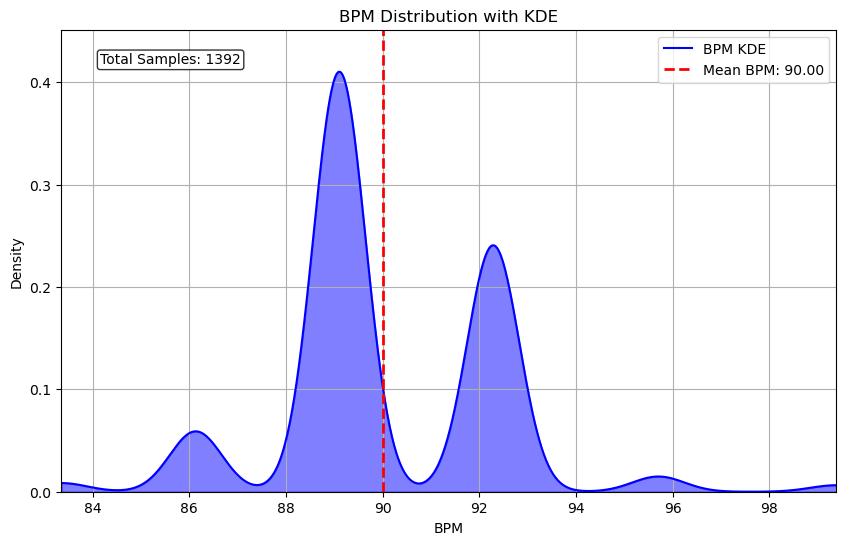

In [62]:
# Plot the histogram of BPM values
plot_stable_bpm(stable_intervals)

## Modeling and visualizations

In [1]:
import numpy as np
import librosa
from typing import Tuple, List, Optional
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
def get_studio_bpm(beat_frames: np.ndarray, sr: int = 22050, hop_length: int = 512,
                   variance_threshold: float = 0.01, window_length: int = 4) -> Tuple[Optional[float], np.ndarray, np.ndarray]:
    """
    Analyze the provided beat frame indices to determine the studio BPM and the start frame of stable intervals.
    
    Parameters:
    - beat_frames (np.ndarray): Array of beat frame indices.
    - sr (int): The sample rate of the audio. Default is 22050 Hz.
    - hop_length (int): The number of samples per frame. Default is 512.
    - variance_threshold (float): The threshold for the variance to consider a window of beats as stable.
    - window_length (int): The number of beats to consider within each sliding window when calculating variance.

    Returns:
    Tuple[Optional[float], np.ndarray, np.ndarray]:
        - The studio BPM (float or None if not determined).
        - The frame indices of the first beat of each stable interval.
        - An array of beat interval durations that are considered stable.
    """
    
    # Calculate the time in seconds for each beat frame index
    beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)

    # Calculate beat intervals
    beat_intervals = np.diff(beat_times)
    total_intervals = len(beat_intervals)

    # Store stable intervals (low-variance windows)
    stable_intervals = []
    stable_beat_indices = []

    # Calculate variance in a sliding window
    for i in range(total_intervals - window_length + 1):
        window = beat_intervals[i:i + window_length]
        if np.var(window) < variance_threshold:
            # Extend the list with intervals from the current stable window
            stable_intervals.extend(window)
            # Record the frame index of the first beat in the stable window
            stable_beat_indices.append(i)

    # If we found any stable intervals,
    # calculate the BPM based on the average interval
    if stable_intervals:
        average_interval = np.mean(stable_intervals)
        studio_bpm = 60.0 / average_interval
    else:
        # No stable intervals found; return None for BPM
        studio_bpm = None

    # Convert the stable beat indices to frame indices
    stable_frames = beat_frames[stable_beat_indices]

    # Return the studio BPM if calculated, the frame indices of the stable beats, and the stable interval durations (for plotting BPM)
    return studio_bpm, stable_frames, stable_intervals


def quantize_beats(stable_frames: np.ndarray, studio_bpm: float, duration, sr: int = 22050, hop_length: int = 512,):
    """
    Creates a measure grid based on the studio BPM and the starting time of the first stable interval, 
    extrapolating the grid to the start and end of the song.

    Parameters:
    stable_frames : np.ndarray
        An array of starting frames for stable beat interval sequences.
    studio_bpm : float
        Estimated studio BPM of the audio in beats per minute.
    sr : int
        Sampling rate of the audio signal.
    hop_length : int
        Hop length used in the onset detection and beat tracking.
    duration : float
        Duration of the audio signal in seconds.

    Returns:
    measure_grid : np.ndarray
        Array of quantized measure start times based on the studio BPM.
    """
    # Validate input
    if not stable_frames.size:
        raise ValueError("The 'stable_frames' array must not be empty.")
    if stable_frames.size == 0:
        raise ValueError("No stable frames provided.")
    if not isinstance(stable_frames, np.ndarray):
        raise TypeError("stable_frames must be a numpy.ndarray.")
    
    # Hardcoded assumption of 4/4 time signature
    beats_per_measure = 4

    # Calculate beat interval in seconds using the studio BPM
    beat_interval = 60.0 / studio_bpm

    # Convert the frame index of the first stable interval to time
    first_stable_beat_time = librosa.frames_to_time(stable_frames[0], sr=sr, hop_length=hop_length)

    # Calculate the number of full measures from the start to first stable beat
    measures_to_first_stable = int(np.floor(first_stable_beat_time / (beat_interval * beats_per_measure)))

    # Calculate the start time of the first measure by subtracting the time of complete measures
    first_measure_time = first_stable_beat_time - (measures_to_first_stable * beat_interval * beats_per_measure)

    # Create the beat grid starting from the first measure time, going backwards to the beginning of the song
    backward_beat_grid = np.arange(first_measure_time, -beat_interval, -beat_interval)[::-1]
    
    # Create the beat grid starting from the first measure time, going forwards to the end of the song
    forward_beat_grid = np.arange(first_measure_time, duration, beat_interval)

    # Combine both grids and sort them to create a continuous beat grid
    beat_grid = np.sort(np.concatenate((backward_beat_grid, forward_beat_grid)))

    # Filter out any negative times that may have resulted from the backward extrapolation
    beat_grid = beat_grid[beat_grid >= 0]

    # Ensure beat grid does not go past the duration of the song
    beat_grid = beat_grid[beat_grid <= duration]

    # Create measure grid by selecting every fourth beat (assuming 4/4 time)
    measure_grid = beat_grid[::beats_per_measure]

    return measure_grid


def apply_measure_grid(ax, measure_grid):
    """
    This function takes an axis object and applies measure grid lines,
    sets x-ticks to measure start times for every fourth measure starting from measure 0,
    labels them with measure numbers, and applies sub-ticks for intermediate measure times.
    
    Parameters:
    ax (matplotlib.axes.Axes): The axis object to modify.
    measure_grid (list or array): The list or array of measure start times in seconds.
    """
    measure_numbers = np.arange(len(measure_grid))
    # Adjust the list to start from measure 0 and get every fourth measure
    major_measure_indices = [i for i, measure_num in enumerate(measure_numbers) if (measure_num) % 4 == 0]
    major_measures = [measure_grid[i] for i in major_measure_indices]
    major_labels = [measure_numbers[i] for i in major_measure_indices]
    
    # Set major x-axis ticks and labels (for measure 0 and every fourth measure after)
    ax.set_xticks(major_measures, minor=False)
    ax.set_xticklabels(major_labels, minor=False)

    # Set minor x-axis ticks (for intermediate measures)
    minor_measures = [measure for i, measure in enumerate(measure_grid) if i not in major_measure_indices]
    ax.set_xticks(minor_measures, minor=True)
    
    # Overlay the major measure grid lines on the plot (for measure 0 and every fourth measure after)
    for measure_time in major_measures:
        ax.axvline(x=measure_time, color='green', linestyle='--', linewidth=2)  # Adjusted linewidth for major ticks
    
    # Overlay the minor measure grid lines on the plot (for intermediate measures)
    for measure_time in minor_measures:
        ax.axvline(x=measure_time, color='grey', linestyle=':', linewidth=1, alpha=0.8)  # Adjusted linewidth for minor ticks
    
    ax.set_xlabel('Measure Number')

In [4]:
import numpy as np
import librosa
from scipy.stats import mode
from typing import Tuple, Optional

def get_studio_bpm(beat_frames: np.ndarray, sr: int = 22050, hop_length: int = 512,
                   variance_threshold: float = 0.01, window_length: int = 4) -> Tuple[Optional[float], Optional[float], Optional[float], np.ndarray, np.ndarray]:
    """
    Analyze the provided beat frame indices to determine the studio BPM and the start frame of stable intervals.
    
    Parameters:
    - beat_frames (np.ndarray): Array of beat frame indices generated from librosa.
    - sr (int): The sample rate of the audio. Default is 22050 Hz.
    - hop_length (int): The number of samples per frame. Default is 512.
    - variance_threshold (float): The threshold for the variance to consider a window of beats as stable.
    - window_length (int): The number of beats to consider within each sliding window when calculating variance.

    Returns:
    Tuple[Optional[float], Optional[float], Optional[float], np.ndarray, np.ndarray]:
        - The mean studio BPM (float or None if not determined).
        - The median studio BPM (float or None if determined).
        - The BPM that occurs most frequently near a whole number (float or None if not determined).
        - The frame indices of the first beat of each stable interval.
        - An array of beat interval durations that are considered stable.
    """
    
    # Calculate the time in seconds for each beat frame index
    beat_times = librosa.frames_to_time(beat_frames, sr=sr, hop_length=hop_length)

    # Calculate beat intervals
    beat_intervals = np.diff(beat_times)
    total_intervals = len(beat_intervals)

    # Store stable intervals (low-variance windows)
    stable_intervals = []
    stable_frames = []

    # Calculate variance in a sliding window
    for i in range(total_intervals - window_length + 1):
        window = beat_intervals[i:i + window_length]
        if np.var(window) < variance_threshold:
            # Extend the list with intervals from the current stable window
            stable_intervals.extend(window)
            # Record the frame index of the first beat in the stable window
            stable_frames.append(beat_frames[i])


    # If we found any stable intervals, calculate the BPMs
    if stable_intervals:
        # Calculate BPMs for each stable interval
        stable_bpms = 60.0 / np.array(stable_intervals)
        mean_studio_bpm = np.mean(stable_bpms)
        median_studio_bpm = np.median(stable_bpms)
    
        # Find the BPM closest to a whole number
        differences = np.abs(stable_bpms - np.round(stable_bpms))
        index_of_closest_bpm = np.argmin(differences)
        closest_whole_bpm = stable_bpms[index_of_closest_bpm]
    else:
        # No stable intervals found; return None for mean and median BPM
        mean_studio_bpm = None
        median_studio_bpm = None
        closest_whole_bpm = None

    # Return the mean and median studio BPM if calculated, the mode BPM, the frame indices of the stable beats, and the stable interval durations
    return mean_studio_bpm, median_studio_bpm, closest_whole_bpm, stable_frames, stable_intervals

In [7]:
get_studio_bpm(beats)

(90.0572541183361,
 89.1029094827589,
 89.10290948275797,
 [461,
  490,
  519,
  548,
  576,
  606,
  636,
  664,
  694,
  723,
  752,
  781,
  809,
  837,
  866,
  895,
  924,
  955,
  985,
  1013,
  1042,
  1071,
  1099,
  1126,
  1155,
  1183,
  1212,
  1240,
  1267,
  1294,
  1321,
  1349,
  1379,
  1408,
  1436,
  1466,
  1497,
  1525,
  1553,
  1582,
  1611,
  1641,
  1670,
  1700,
  1729,
  1758,
  1788,
  1818,
  1847,
  1876,
  1905,
  1934,
  1962,
  1990,
  2018,
  2047,
  2075,
  2102,
  2130,
  2158,
  2186,
  2215,
  2244,
  2272,
  2300,
  2328,
  2356,
  2385,
  2415,
  2443,
  2472,
  2501,
  2530,
  2559,
  2587,
  2615,
  2644,
  2673,
  2702,
  2731,
  2760,
  2789,
  2817,
  2845,
  2874,
  2903,
  2932,
  2960,
  2989,
  3018,
  3047,
  3075,
  3104,
  3133,
  3161,
  3190,
  3218,
  3247,
  3275,
  3304,
  3332,
  3361,
  3390,
  3418,
  3447,
  3475,
  3504,
  3533,
  3561,
  3590,
  3619,
  3648,
  3677,
  3705,
  3734,
  3763,
  3791,
  3820,
  3849,
  3877,
 

In [6]:
# Load the audio file
audio_file = r"..\data\audio_files\processed_download\CloZee - Microworlds.mp3"
hop_length = 512
sr=22050

y, sr = librosa.load(audio_file, sr=22050) 
duration = librosa.get_duration(y=y, sr=sr, hop_length=hop_length)
y_harm, y_perc = librosa.effects.hpss(y)
onset_env = librosa.onset.onset_strength(y=y, sr=sr, hop_length=hop_length)
tempo, beats = librosa.beat.beat_track(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
get_studio_bpm(beats)

(90.0572541183361,
 89.1029094827589,
 89.10290948275797,
 [461,
  490,
  519,
  548,
  576,
  606,
  636,
  664,
  694,
  723,
  752,
  781,
  809,
  837,
  866,
  895,
  924,
  955,
  985,
  1013,
  1042,
  1071,
  1099,
  1126,
  1155,
  1183,
  1212,
  1240,
  1267,
  1294,
  1321,
  1349,
  1379,
  1408,
  1436,
  1466,
  1497,
  1525,
  1553,
  1582,
  1611,
  1641,
  1670,
  1700,
  1729,
  1758,
  1788,
  1818,
  1847,
  1876,
  1905,
  1934,
  1962,
  1990,
  2018,
  2047,
  2075,
  2102,
  2130,
  2158,
  2186,
  2215,
  2244,
  2272,
  2300,
  2328,
  2356,
  2385,
  2415,
  2443,
  2472,
  2501,
  2530,
  2559,
  2587,
  2615,
  2644,
  2673,
  2702,
  2731,
  2760,
  2789,
  2817,
  2845,
  2874,
  2903,
  2932,
  2960,
  2989,
  3018,
  3047,
  3075,
  3104,
  3133,
  3161,
  3190,
  3218,
  3247,
  3275,
  3304,
  3332,
  3361,
  3390,
  3418,
  3447,
  3475,
  3504,
  3533,
  3561,
  3590,
  3619,
  3648,
  3677,
  3705,
  3734,
  3763,
  3791,
  3820,
  3849,
  3877,
 

In [130]:
def get_studio_bpm(backtracked_beat_frames: np.ndarray, beat_frames: np.ndarray, sr: int = 22050, 
                   hop_length: int = 256, variance_threshold: float = .01, window_length: int = 8, 
                   max_gap: int = 0
                   ) -> Tuple[Optional[float], Optional[float], Optional[float], np.ndarray, np.ndarray]:
    """
    Analyze the provided backtracked beat frame indices and peak beat frame indices to determine the studio BPM and 
    the start frame of stable intervals.
    
    Parameters:
    - backtracked_beat_frames (np.ndarray): Array of backtracked beat frame indices generated from librosa.
    - beat_frames (np.ndarray): Array of peak beat frame indices generated from librosa.
    - sr (int): The sample rate of the audio. Default is 22050 Hz.
    - hop_length (int): The number of samples per frame. Default is 512.
    - variance_threshold (float): The threshold for the variance to consider a window of beats as stable.
    - window_length (int): The number of beats to consider within each sliding window when calculating variance.
    - max_gap (int): The maximum allowed gap between beats in a sequence.

    Returns:
    Tuple[Optional[float], Optional[float], Optional[float], np.ndarray, np.ndarray]:
        - The mean studio BPM (float or None if not determined).
        - The median studio BPM (float or None if determined).
        - The BPM that occurs most frequently near a whole number (float or None if not determined).
        - The frame indices of the first beat of each stable interval.
        - An array of beat interval durations that are considered stable.
    """
    
    # Calculate intervals starting at backtracked frame of one beat and ending at the peak frame of the next one
    beat_intervals = np.diff(beat_frames[0:len(backtracked_beat_frames)])  # Same length as backtracked_beat_frames

    # Convert intervals to time
    beat_intervals_time = librosa.frames_to_time(beat_intervals, sr=sr, hop_length=hop_length)
    
    stable_frames = []
    stable_intervals = []
    stable_sequences = []  # To keep track of all the stable sequences

    for i in range(len(backtracked_beat_frames) - window_length):
        window_frames = backtracked_beat_frames[i:i + window_length].tolist()  # Convert to list for .append()
        j = i + window_length
        while j < len(backtracked_beat_frames) and beat_frames[j] - window_frames[-1] <= max_gap * hop_length:
            window_frames.append(backtracked_beat_frames[j])  
            j += 1

        # Calculate the intervals for the current window
        window_intervals = np.diff(librosa.frames_to_time(window_frames, sr=sr, hop_length=hop_length))
        if np.var(window_intervals) < variance_threshold:
            stable_sequences.append(window_frames)  # Append the entire sequence
            stable_intervals.extend(window_intervals)  # Extend stable_intervals list
    
    # Convert stable_intervals list to array
    stable_intervals = np.array(stable_intervals)

    # Process stable intervals to calculate BPM
    if stable_intervals.size > 0:
        stable_bpms = 60.0 / stable_intervals
        mean_studio_bpm = np.mean(stable_bpms)
        median_studio_bpm = np.median(stable_bpms)

        # Find the BPM closest to a whole number
        differences = np.abs(stable_bpms - np.round(stable_bpms))
        index_of_closest_bpm = np.argmin(differences)
        closest_whole_bpm = np.round(stable_bpms[index_of_closest_bpm])

        # Extract the first backtracked beat frame of each stable sequence
        stable_frames = np.array([seq[0] for seq in stable_sequences])
    else:
        mean_studio_bpm = None
        median_studio_bpm = None
        closest_whole_bpm = None

    return mean_studio_bpm, median_studio_bpm, closest_whole_bpm, stable_frames, stable_intervals

# Backtrack the beats to the nearest preceding local minimum of the onset envelope
backtracked_beats = librosa.onset.onset_backtrack(beats, onset_env)

mean_studio_bpm, median_studio_bpm, closest_whole_bpm, stable_beat_frames, stable_beat_intervals = get_studio_bpm(backtracked_beats, beats)
mean_studio_bpm, median_studio_bpm, closest_whole_bpm

(90.33472155330243, 90.66611842105284, 82.0)

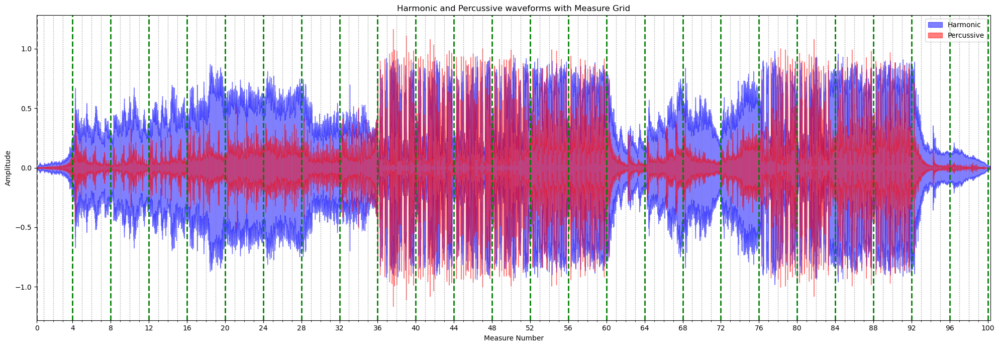

In [26]:
fig, ax = plt.subplots(figsize=(20, 7))
librosa.display.waveshow(y_harm, sr=sr, alpha=0.5, ax=ax, label='Harmonic', color='b')
librosa.display.waveshow(y_perc, sr=sr, alpha=0.5, ax=ax, label='Percussive', color='r')
ax.set_xlim([0, duration])
apply_measure_grid(ax, measure_grid)
ax.set_ylabel('Amplitude')
ax.set(title='Harmonic and Percussive waveforms with Measure Grid')
ax.legend()
plt.tight_layout()
plt.show()

In [ ]:
# Features to model
# Tempogram
tempogram = librosa.feature.tempogram(onset_envelope=onset_env, sr=sr, hop_length=hop_length)
# Tempogram ratio
tgr = librosa.feature.tempogram_ratio(tg=tempogram, sr=sr)
# Chromagram
chroma_cq = librosa.feature.chroma_cqt(y=y_harm, sr=sr)
# Melspectrogram (S_dB)
D = np.abs(librosa.stft(y))**2
S = librosa.feature.melspectrogram(S=D, sr=sr)
S_dB = librosa.power_to_db(S, ref=np.max)
# Tonnetz
tonnetz = librosa.feature.tonnetz(y=y, sr=sr, chroma=chroma_cq)
# MFCC
mfccs = librosa.feature.mfcc(S=S_dB)

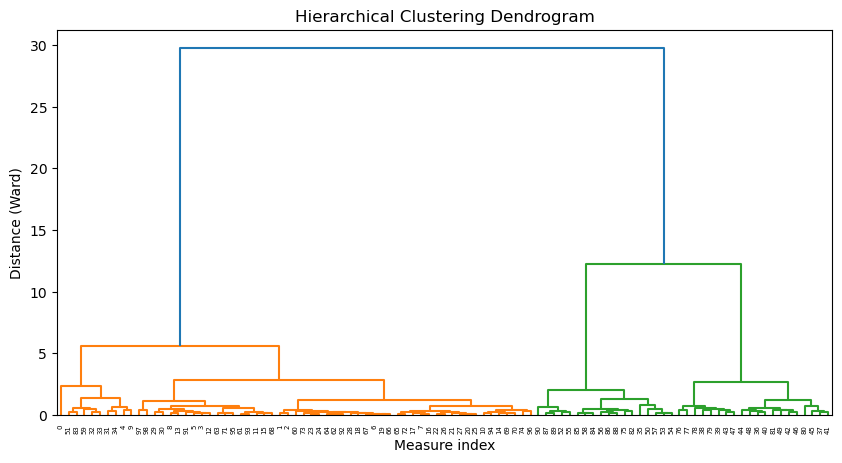

In [15]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.stats import skew, kurtosis

# Convert the measure grid to frame indices
measure_grid_frames = librosa.time_to_frames(measure_grid, sr=sr, hop_length=hop_length)

# Compute statistical features for each measure
sliced_tempogram_features = []
for i in range(len(measure_grid_frames) - 1):
    start_frame = measure_grid_frames[i]
    end_frame = measure_grid_frames[i+1]
    if start_frame < end_frame:
        measure_slice = tempogram[:, start_frame:end_frame]
        mean_features = np.mean(measure_slice, axis=1)
        var_features = np.var(measure_slice, axis=1)
        feature_vector = np.concatenate((mean_features, var_features))
        sliced_tempogram_features.append(feature_vector)
    else:
        print(f"Invalid or empty slice from frame {start_frame} to frame {end_frame}")

# Convert the list of feature vectors to a NumPy array
features_matrix = np.array(sliced_tempogram_features)

# Perform hierarchical clustering
Z = linkage(features_matrix, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Measure index')
plt.ylabel('Distance (Ward)')
plt.show()

In [17]:
def apply_measure_grid_with_clustering(ax, measure_grid, measure_numbers, cluster_labels):
    """
    This function takes an axis object and applies measure grid lines, sets x-ticks to measure start times
    for every fourth measure starting from measure 0, labels them with measure numbers, applies sub-ticks for
    intermediate measure times, and overlays the clustering information.
    
    Parameters:
    ax (matplotlib.axes.Axes): The axis object to modify.
    measure_grid (list or array): The list or array of measure start times in seconds.
    measure_numbers (list or array): The list or array of measure numbers corresponding to the start times.
    cluster_labels (list or array): The list or array of cluster labels for each measure.
    """
    # Ensure that measure grid and cluster labels have the same length
    min_length = min(len(measure_grid), len(cluster_labels))
    measure_grid = measure_grid[:min_length]
    cluster_labels = cluster_labels[:min_length]
    measure_numbers = measure_numbers[:min_length]
    
    # Get unique cluster identifiers and assign a color to each
    unique_clusters = np.unique(cluster_labels)
    colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_clusters)))

    # Assign colors to clusters
    cluster_colors = {cluster: colors[i] for i, cluster in enumerate(unique_clusters)}

    # Major and minor measure indices
    major_measure_indices = [i for i, measure_num in enumerate(measure_numbers) if measure_num % 4 == 0]
    minor_measure_indices = [i for i in range(len(measure_grid)) if i not in major_measure_indices]

    # Set major x-axis ticks and labels (for measure 0 and every fourth measure after)
    major_measures = [measure_grid[i] for i in major_measure_indices]
    ax.set_xticks(major_measures, minor=False)
    ax.set_xticklabels([measure_numbers[i] for i in major_measure_indices], minor=False)

    # Set minor x-axis ticks (for intermediate measures)
    ax.set_xticks([measure_grid[i] for i in minor_measure_indices], minor=True)
    
    # Overlay the measure grid lines and clustering information on the plot
    for i, measure_time in enumerate(measure_grid):
        color = cluster_colors[cluster_labels[i]]  # Assign color based on cluster label
        linestyle = '--' if i in major_measure_indices else ':'
        linewidth = 2 if i in major_measure_indices else 1
        ax.axvline(x=measure_time, color=color, linestyle=linestyle, linewidth=linewidth, alpha=0.7 if linestyle == ':' else 1)

    # Add color legend for clusters
    for cluster, color in cluster_colors.items():
        ax.plot([], [], color=color, linestyle='--', linewidth=2, label=f'Cluster {cluster}')
    
    ax.legend(title="Clusters", loc='upper right')
    
    ax.set_xlabel('Measure Number')

In [27]:
import numpy as np
import librosa.display
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from matplotlib import pyplot as plt

# Tempogram and measure grid arrays
np.random.seed(42)

# Convert the measure grid to frame indices
measure_grid_frames = librosa.time_to_frames(measure_grid, sr=sr, hop_length=hop_length)

# Compute statistical features for each measure
sliced_tempogram_features = []
for i in range(len(measure_grid_frames) - 1):
    start_frame = measure_grid_frames[i]
    end_frame = measure_grid_frames[i+1]
    if start_frame < end_frame:
        measure_slice = tempogram[:, start_frame:end_frame]
        mean_features = np.mean(measure_slice, axis=1)
        var_features = np.var(measure_slice, axis=1)
        feature_vector = np.concatenate((mean_features, var_features))
        sliced_tempogram_features.append(feature_vector)
    else:
        print(f"Invalid or empty slice from frame {start_frame} to frame {end_frame}")

# Convert the list of feature vectors to a NumPy array
features_matrix = np.array(sliced_tempogram_features)

# Perform hierarchical clustering
Z = linkage(features_matrix, method='ward')

# Create flat clusters to use for coloring the measure grid
max_d = 7  # This is an example threshold for cluster formation, you might need to adjust it
clusters = fcluster(Z, max_d, criterion='distance')

# Generate colors for clusters
unique_clusters = np.unique(clusters)
colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_clusters)))

# Create a color mapping for clusters
cluster_color_map = {cluster: color for cluster, color in zip(unique_clusters, colors)}

fig, ax = plt.subplots(figsize=(14, 5))

# Plot the waveform
librosa.display.waveshow(y, sr=sr, ax=ax, color='r')

# Shade the background based on clustering
for i, (start_time, cluster_label) in enumerate(zip(measure_grid, clusters)):
    end_time = measure_grid[i+1] if i+1 < len(measure_grid) else len(y) / sr
    ax.fill_between(x=[start_time, end_time], y1=min(y), y2=max(y), color=cluster_color_map[cluster_label], alpha=0.5)

# Set labels and title
ax.set_ylabel('Amplitude')
ax.set_title('Waveform with Background Shading Based on Clustering')

# Create a legend for the clusters
for cluster_label, color in cluster_color_map.items():
    ax.plot([], [], color=color, label=f'Cluster {cluster_label}', alpha=0.5)
ax.legend(loc='upper right')
apply_measure_grid(ax, measure_grid, measure_numbers)

# Show the plot
plt.tight_layout()
plt.show()

NameError: name 'tempogram' is not defined

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


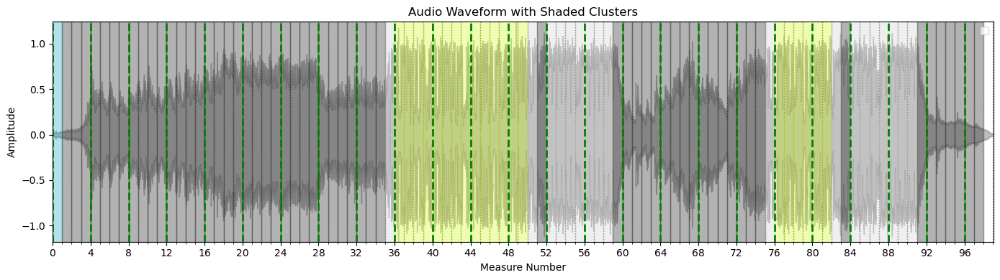

In [46]:
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform

# Assume `features_matrix` contains your extracted features for each measure

# Compute the standard distance matrix based on features
feature_distances = pdist(features_matrix)

# Convert to a square form for easier manipulation
feature_distances_square = squareform(feature_distances)

# Compute a sequential penalty matrix
n_measures = features_matrix.shape[0]
sequential_penalty = np.abs(np.subtract.outer(np.arange(n_measures), np.arange(n_measures)))
sequential_penalty_log = np.log1p(sequential_penalty)

# Apply a scaling factor to the sequential penalty to control its influence
scaling_factor = .4  # Adjust this to suit how strongly you want the sequence to influence clustering
sequential_penalty_scaled = sequential_penalty_log * scaling_factor

# Combine the feature distances with the sequential penalty
combined_distances_square = feature_distances_square + sequential_penalty_scaled

# Convert back to condensed form to use with linkage
combined_distances_condensed = squareform(combined_distances_square, checks=False, force='tovector')

Z = linkage(combined_distances_condensed, method='average')  # You can choose other linkage methods as well

# Create flat clusters to use for coloring the measure grid
max_d = 3  # Example threshold, adjust as necessary
clusters = fcluster(Z, max_d, criterion='distance')

# Plot waveform with shaded regions based on clusters
fig, ax = plt.subplots(figsize=(14, 4))

# Plot the waveform using librosa's display function
librosa.display.waveshow(y, sr=sr, ax=ax, alpha=0.5, color='grey')

# Get the max and min values of the waveform for setting y-axis limits later
y_max = np.max(y)
y_min = np.min(y)

# Generate colors for clusters, ensuring that there's one color per cluster
unique_clusters = np.unique(clusters)
colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_clusters)))

# Create a mapping of cluster labels to colors
cluster_color_map = dict(zip(unique_clusters, colors))

# Shade the background based on clusters
for i, cluster_label in enumerate(clusters[:-1]):  # Skip the last one to prevent index out of range
    start_time = measure_grid[i]
    end_time = measure_grid[i + 1]
    ax.axvspan(start_time, end_time, color=cluster_color_map[cluster_label], alpha=0.3)

# If the last cluster extends to the end of the audio, shade it too
if len(clusters) == len(measure_grid):
    ax.axvspan(measure_grid[-1], duration, color=cluster_color_map[clusters[-1]], alpha=0.3)

# Set the x-axis and y-axis limits
ax.set_xlim(0, duration)
ax.set_ylim(y_min, y_max)

# Set labels and a title (optional)
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_ylabel('Amplitude')
ax.set_title('Audio Waveform with Shaded Clusters')
ax.legend(loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform


# Extract the features using librosa
chromagram = chroma_cq
mel_spectrogram = S_dB

# Normalize the features
scaler = StandardScaler()
tempogram_norm = scaler.fit_transform(tempogram.T)  # .T to transpose for scaler
chromagram_norm = scaler.fit_transform(chromagram.T)
mel_spectrogram_norm = scaler.fit_transform(mel_spectrogram.T)

# Apply PCA (optional step if you want to reduce dimensionality)
pca = PCA(n_components=3)
tempogram_pca = pca.fit_transform(tempogram_norm)
chromagram_pca = pca.fit_transform(chromagram_norm)
mel_spectrogram_pca = pca.fit_transform(mel_spectrogram_norm)

# Concatenate the feature vectors
combined_features = np.hstack((tempogram_pca, chromagram_pca, mel_spectrogram_pca))

# Calculate the feature-based distances
feature_distances = pdist(combined_features, metric='euclidean')
n_measures = combined_features.shape[0]
sequential_penalty = np.abs(np.subtract.outer(np.arange(n_measures), np.arange(n_measures)))
sequential_penalty_log = np.log1p(sequential_penalty)

# Apply a scaling factor to the sequential penalty to control its influence
scaling_factor = .4  # Adjust this to suit how strongly you want the sequence to influence clustering
sequential_distances = sequential_penalty_log * scaling_factor

# Scale the sequential distances to be on the same scale as feature distances
sequential_distances_scaled = sequential_distances / np.max(sequential_distances) * np.max(feature_distances)

# Combine the two distance matrices
# This could be a simple addition, or a more complex function, depending on your needs
combined_distances = feature_distances + sequential_distances_scaled

# Convert the condensed distance matrix to a square matrix
combined_square_distance_matrix = squareform(combined_distances)

# Perform hierarchical clustering
Z = linkage(combined_square_distance_matrix, method='ward')

# Decide on a cutoff threshold or the number of clusters you want
# Use fcluster to form flat clusters from the hierarchical clustering defined by the linkage matrix 'Z'
threshold = 1.5  # Example threshold, you'll need to determine what works for your case
clusters = fcluster(Z, threshold, criterion='distance')

# Plot waveform with shaded regions based on clusters
fig, ax = plt.subplots(figsize=(14, 4))

# Plot the waveform using librosa's display function
librosa.display.waveshow(y, sr=sr, ax=ax, alpha=0.5, color='grey')

# Get the max and min values of the waveform for setting y-axis limits later
y_max = np.max(y)
y_min = np.min(y)

# Generate colors for clusters, ensuring that there's one color per cluster
unique_clusters = np.unique(clusters)
colors = plt.cm.nipy_spectral(np.linspace(0, 1, len(unique_clusters)))

# Create a mapping of cluster labels to colors
cluster_color_map = dict(zip(unique_clusters, colors))

# Shade the background based on clusters
for i, cluster_label in enumerate(clusters[:-1]):  # Skip the last one to prevent index out of range
    start_time = measure_grid[i]
    end_time = measure_grid[i + 1]
    ax.axvspan(start_time, end_time, color=cluster_color_map[cluster_label], alpha=0.3)

# If the last cluster extends to the end of the audio, shade it too
if len(clusters) == len(measure_grid):
    ax.axvspan(measure_grid[-1], duration, color=cluster_color_map[clusters[-1]], alpha=0.3)

# Set the x-axis and y-axis limits
ax.set_xlim(0, duration)
ax.set_ylim(y_min, y_max)

# Set labels and a title (optional)
apply_measure_grid(ax, measure_grid, measure_numbers)
ax.set_ylabel('Amplitude')
ax.set_title('Audio Waveform with Shaded Clusters')
ax.legend(loc='upper right')

# Show the plot
plt.tight_layout()
plt.show()

MemoryError: Unable to allocate 1008. MiB for an array with shape (11492, 11492) and data type float64

In [21]:
features_matrix.shape

(99, 768)

In [26]:
sequential_penalty

array([[ 0,  1,  2, ..., 96, 97, 98],
       [ 1,  0,  1, ..., 95, 96, 97],
       [ 2,  1,  0, ..., 94, 95, 96],
       ...,
       [96, 95, 94, ...,  0,  1,  2],
       [97, 96, 95, ...,  1,  0,  1],
       [98, 97, 96, ...,  2,  1,  0]])